# ***EXP-03***

In [ ]:
!pip install opencv-python

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from google.colab import files

# ---- Upload Image ----
uploaded = files.upload()   # Upload your images.jpg here

# Load the uploaded image
image = cv2.imread("sample2.jpg")  # Uploaded filename must match
if image is None:
    print("Could not load image. Please check the file name.")
else:
    print("Image Loaded Successfully!")

# 1. Line
line_img = image.copy()
cv2.line(line_img, (50, 50), (300, 50), (0, 255, 0), 3)
cv2_imshow(line_img)

# 2. Rectangle
rect_img = image.copy()
cv2.rectangle(rect_img, (100, 100), (400, 200), (255, 0, 0), 3)
cv2_imshow(rect_img)

# 3. Circle
circle_img = image.copy()
cv2.circle(circle_img, (250, 250), 50, (0, 0, 255), -1)
cv2_imshow(circle_img)

# 4. Ellipse
ellipse_img = image.copy()
cv2.ellipse(ellipse_img, (300, 150), (100, 40), 0, 0, 360, (0, 255, 255), 2)
cv2_imshow(ellipse_img)

# 5. Text
text_img = image.copy()
cv2.putText(text_img, "Experiment No 2 is Done!", (50, 300),
            cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255, 255, 255), 2)
cv2_imshow(text_img)

Output hidden; open in https://colab.research.google.com to view.

# ***EXP-04***

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from google.colab import files

# ---- Upload Image ----
uploaded = files.upload()
filename = list(uploaded.keys())[0]
print("Uploaded:", filename)

# Load image
image = cv2.imread(filename)
if image is None:
    print("Image not found.")
    raise SystemExit

# Helper function to label images
def label_image(img, text):
    labeled = img.copy()
    cv2.putText(labeled, text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX,
                1, (255, 255, 255), 2, cv2.LINE_AA)
    return labeled

# 1. Grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(label_image(cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR), "Grayscale"))

# 2. HSV
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
cv2_imshow(label_image(cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR), "HSV Color Space"))

# 3. Histogram Equalization
plt.figure(figsize=(6,4))
plt.title("Original Grayscale Histogram")
plt.hist(gray.ravel(), bins=256, range=(0,256))
plt.show()

equalized = cv2.equalizeHist(gray)
cv2_imshow(label_image(cv2.cvtColor(equalized, cv2.COLOR_GRAY2BGR), "Histogram Equalization"))

# 4. Image Smoothing
avg_blur = cv2.blur(image, (5, 5))
cv2_imshow(label_image(avg_blur, "Average Blur"))

gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
cv2_imshow(label_image(gaussian_blur, "Gaussian Blur"))

median_blur = cv2.medianBlur(image, 5)
cv2_imshow(label_image(median_blur, "Median Blur"))

# 5. Gradients
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
sobel_combined = cv2.magnitude(sobel_x, sobel_y)

cv2_imshow(label_image(cv2.convertScaleAbs(sobel_x), "Sobel X"))
cv2_imshow(label_image(cv2.convertScaleAbs(sobel_y), "Sobel Y"))
cv2_imshow(label_image(cv2.convertScaleAbs(sobel_combined), "Sobel Combined"))

laplacian = cv2.Laplacian(gray, cv2.CV_64F)
cv2_imshow(label_image(cv2.convertScaleAbs(laplacian), "Laplacian"))

# 6. Canny
edges = cv2.Canny(gray, 100, 200)
cv2_imshow(label_image(cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR), "Canny Edge Detection"))

Output hidden; open in https://colab.research.google.com to view.

# ***EXP-05***

Saving image11.jpeg to image11 (1).jpeg
Uploaded: image11 (1).jpeg


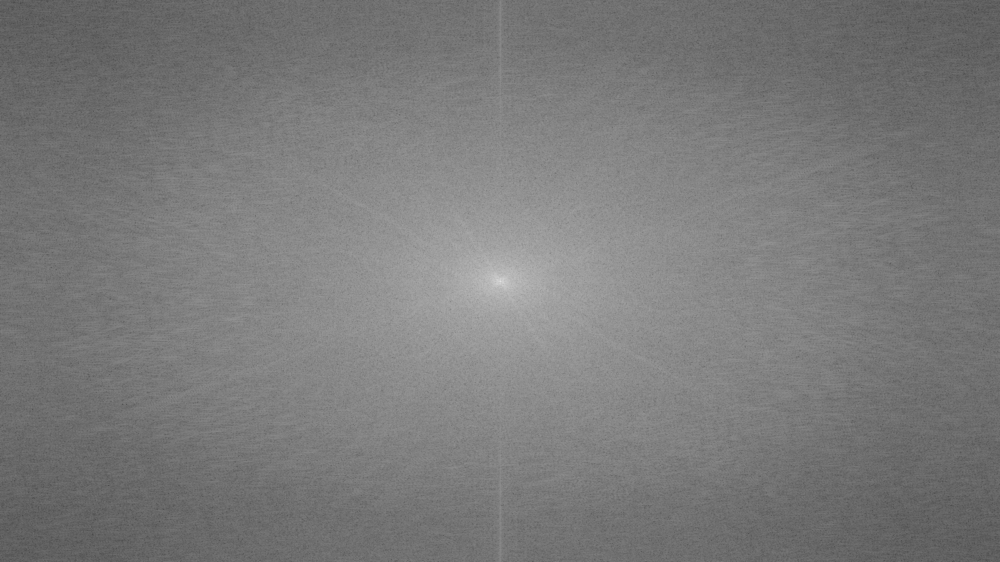

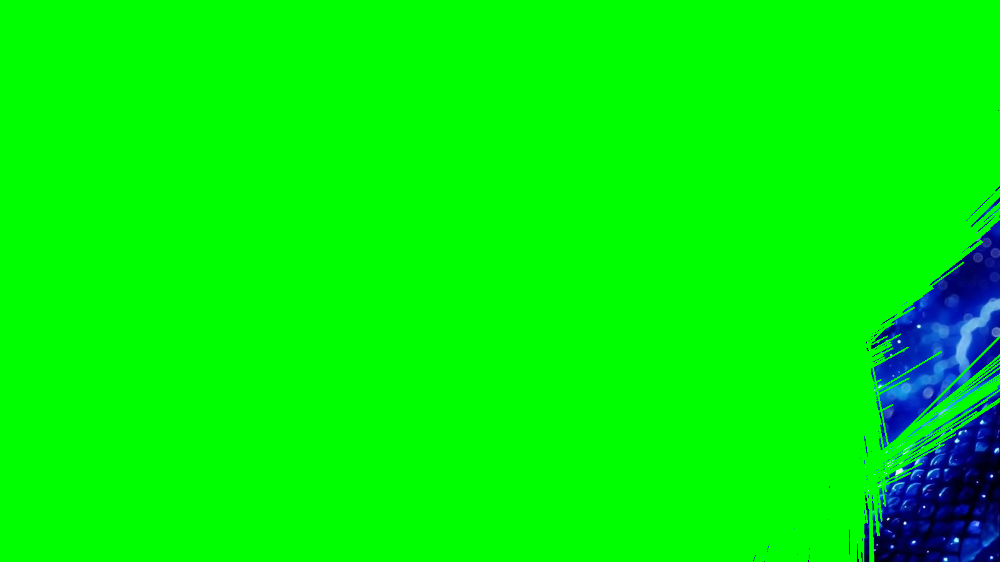

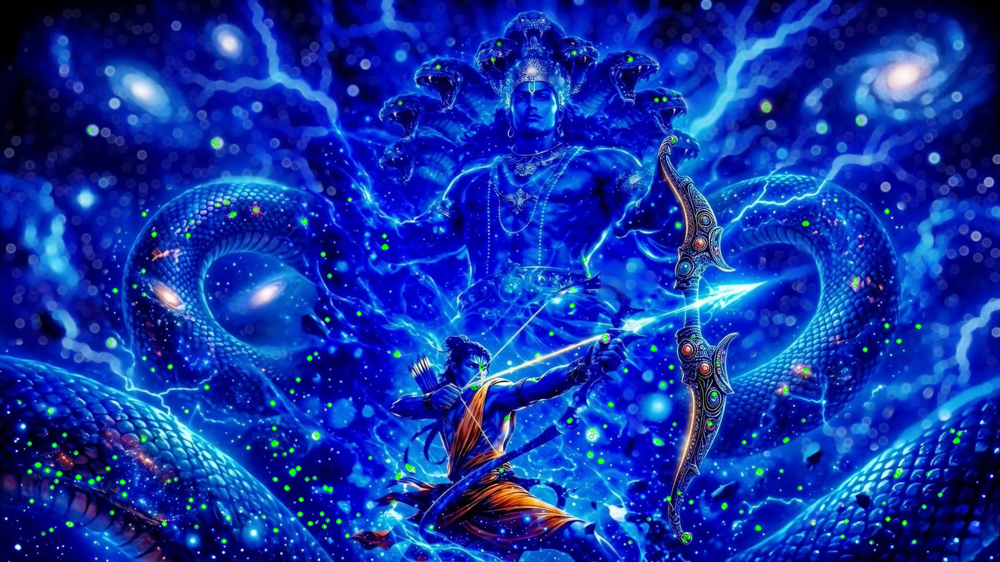

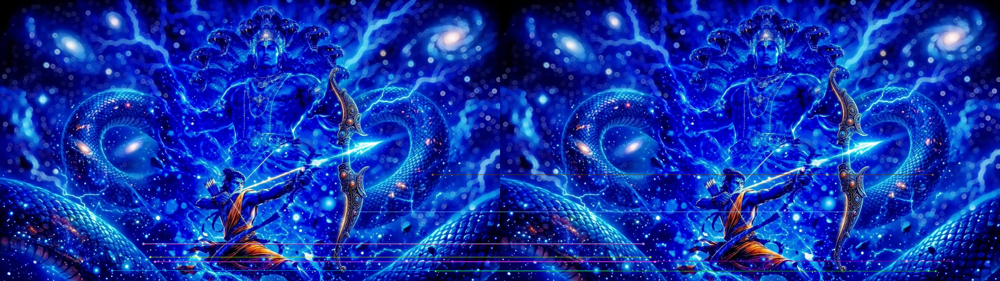

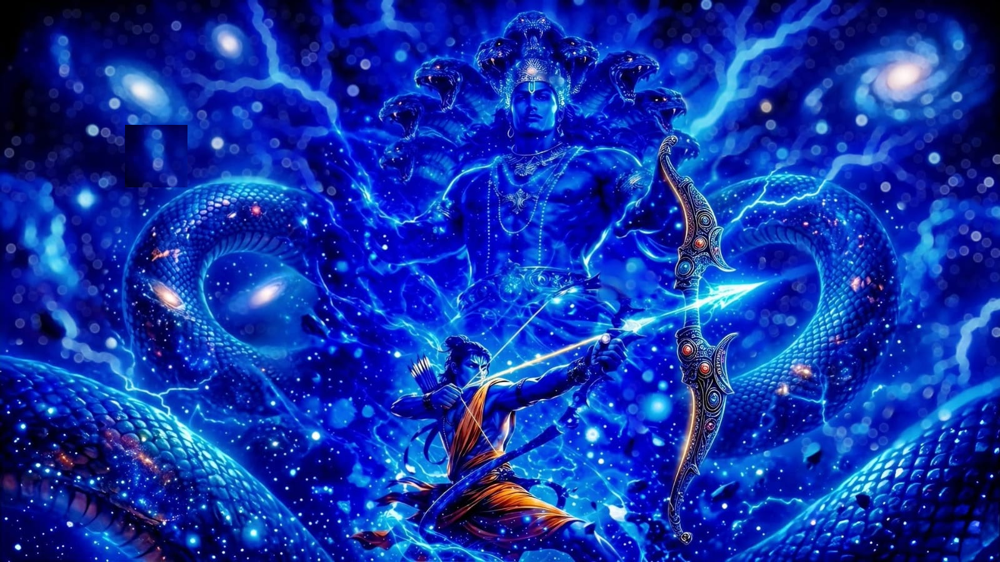

In [2]:
import cv2
import numpy as np
from google.colab import files
from google.colab.patches import cv2_imshow

# ---- Upload Image ----
uploaded = files.upload()
filename = list(uploaded.keys())[0]
print("Uploaded:", filename)

# Load image
img = cv2.imread(filename, cv2.IMREAD_COLOR)
if img is None:
    print("Error loading image.")
    raise SystemExit

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# ----------------------------------------
# 1. Fourier Transform
# ----------------------------------------
dft = cv2.dft(np.float32(gray), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

magnitude_spectrum = 20 * np.log(
    cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]) + 1
)

norm_mag = np.uint8(magnitude_spectrum / np.max(magnitude_spectrum) * 255)
cv2_imshow(norm_mag)

# ----------------------------------------
# 2. Hough Line Transform
# ----------------------------------------
edges = cv2.Canny(gray, 50, 150)
lines = cv2.HoughLines(edges, 1, np.pi / 180, 120)

hough_img = img.copy()
if lines is not None:
    for rho, theta in lines[:, 0]:
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(hough_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

cv2_imshow(hough_img)

# ----------------------------------------
# 3. ORB Feature Detection
# ----------------------------------------
orb = cv2.ORB_create()
kp1, des1 = orb.detectAndCompute(gray, None)

img_orb = cv2.drawKeypoints(img, kp1, None, color=(0, 255, 0), flags=0)
cv2_imshow(img_orb)

# ----------------------------------------
# 4. Feature Matching (Self-match demo)
# ----------------------------------------
kp2, des2 = orb.detectAndCompute(gray, None)
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

match_img = cv2.drawMatches(img, kp1, img, kp2, matches[:10], None, flags=2)
cv2_imshow(match_img)

# ----------------------------------------
# 5. Simple Image Cloning
# ----------------------------------------
clone = img.copy()
src_region = img[50:150, 50:150]   # ROI to copy
clone[200:300, 200:300] = src_region  # Paste region

cv2_imshow(clone)

# ***EXP-06***

Saving sample2.jpeg to sample2 (4).jpeg
Uploaded: sample2 (4).jpeg
Original Image:


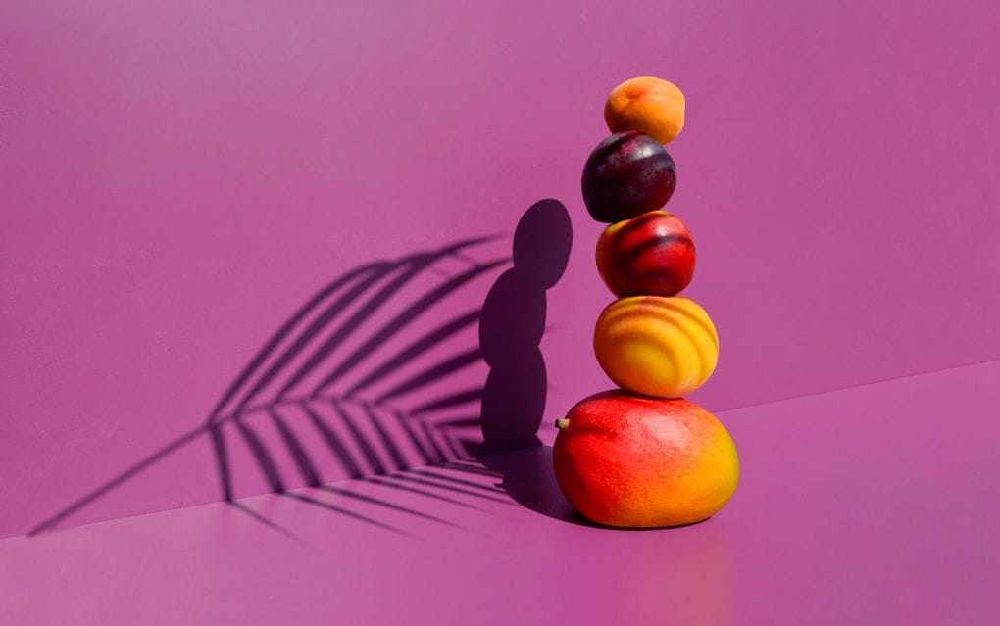

Segmented Foreground:


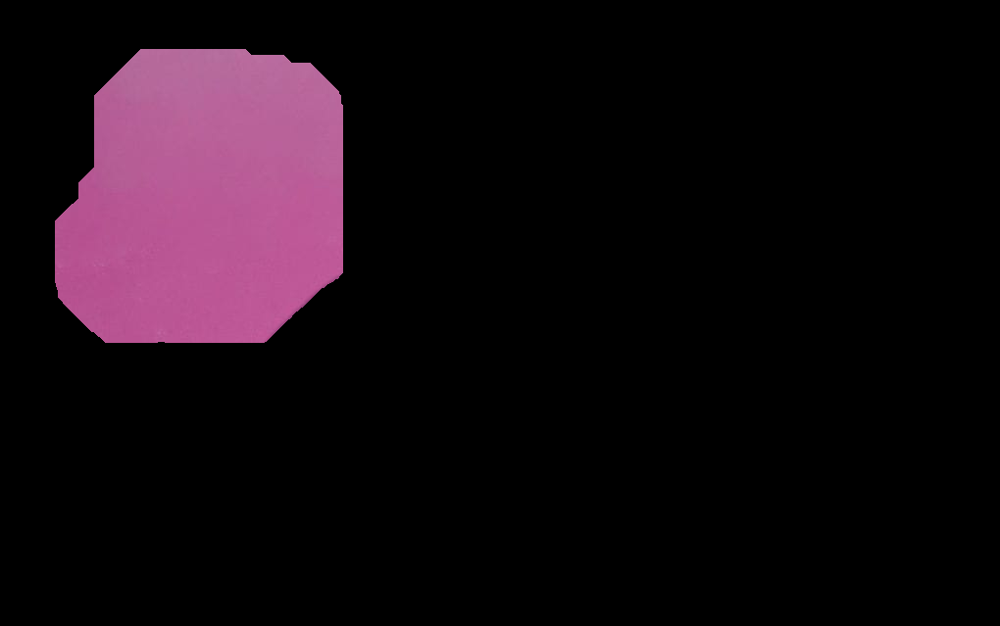

In [ ]:
import cv2
import numpy as np
from google.colab import files
from google.colab.patches import cv2_imshow

# ---- Upload Image ----
uploaded = files.upload()
filename = list(uploaded.keys())[0]
print("Uploaded:", filename)

# Load the image
img = cv2.imread(filename)
if img is None:
    print("Image not found.")
    raise SystemExit

# Create an initial mask
mask = np.zeros(img.shape[:2], np.uint8)

# Define models for background and foreground
bgModel = np.zeros((1, 65), np.float64)
fgModel = np.zeros((1, 65), np.float64)

# Rectangle (x, y, width, height)
rect = (50, 50, 300, 300)

# Apply GrabCut
cv2.grabCut(img, mask, rect, bgModel, fgModel, 5, cv2.GC_INIT_WITH_RECT)

# Convert mask to binary: 0/2 = background, 1/3 = foreground
mask2 = np.where((mask == 0) | (mask == 2), 0, 1).astype("uint8")
result = img * mask2[:, :, np.newaxis]

# Show results
print("Original Image:")
cv2_imshow(img)

print("Segmented Foreground:")
cv2_imshow(result)

# ***EXP-07***

In [ ]:
!pip install mediapipe opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.4/11.4 MB 317.0 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 388.0 kB/s eta 0:00:00
  Attempting uninstall: absl-py
    Found existing installation: absl-py 1.4.0
    Uninstalling absl-py-1.4.0:
      Successfully uninstalled absl-py-1.4.0


In [ ]:
import cv2
import mediapipe as mp
from google.colab import files
from google.colab.patches import cv2_imshow

# ---- Upload Image ----
uploaded = files.upload()
filename = list(uploaded.keys())[0]
print("Uploaded:", filename)

# Read uploaded image
image = cv2.imread(filename)
if image is None:
    print("Image not found.")
    raise SystemExit

# Initialize MediaPipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True)
mp_drawing = mp.solutions.drawing_utils

# Convert to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Perform pose detection
results = pose.process(image_rgb)

# Draw landmarks
if results.pose_landmarks:
    mp_drawing.draw_landmarks(image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)
    cv2_imshow(image)
else:
    print("No pose landmarks detected.")

Saving WhatsApp Video 2026-04-09 at 10.26.04 AM.mp4 to WhatsApp Video 2026-04-09 at 10.26.04 AM.mp4
Uploaded: WhatsApp Video 2026-04-09 at 10.26.04 AM.mp4
Image not found.


SystemExit: 